In [1]:
!pip install ripser persim scikit-learn matplotlib

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 841.3/841.3 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.6/48.6 kB 3.7 MB/s eta 0:00:00
  Created wheel for hopcroftkarp: filename=hopcroftkarp-1.2.5-py2.py3-none-any.whl size=18104 sha256=333c3649827c6b6fc1c4694ec704cc71c83008bb4f9d0135f8d8a6813067696a
  Stored in directory: /root/.cache/pip/wheels/1f/cc/2d/de23a8b9ae586817b0b44de4a4b1a08f23473e248a644b312f
Successfully built hopcroftkarp


In [2]:
!pip install kmapper

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.8/126.8 kB 4.6 MB/s eta 0:00:00


In [3]:
from sentence_transformers import SentenceTransformer
import numpy as np
from ripser import ripser
from persim import wasserstein, bottleneck
from persim import plot_diagrams
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import DBSCAN
import umap.umap_ as umap
import pandas as pd
import kmapper as km
import warnings
import seaborn as sns

In [4]:
model = SentenceTransformer('all-MiniLM-L6-v2')

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

## Working with the emotions:

In [5]:
# path = "Emotions/"
path = ""     # the root path to access the csv files with the labelled emotions

# list of emotions that we are working with
emotions = ["anger", "fear", "joy", "sadness", "disgust", "neutral", "surprise"]

#lists to put the dialogues in
anger = []
fear = []
joy = []
sadness = []
disgust = []
neutral = []
surprise = []

In [7]:
# putting the dialogues into the lists and embedding the sentences
df = pd.read_csv(path + "anger.csv")
anger = df['dialogue'].tolist()
anger = model.encode(anger, convert_to_tensor=True)
anger = np.array(anger)
print("anger:", anger.shape)

df = pd.read_csv(path + "disgust.csv")
disgust = df['dialogue'].tolist()
disgust = model.encode(disgust, convert_to_tensor=True)
disgust = np.array(disgust)
print("disgust:", disgust.shape)

df = pd.read_csv(path + "fear.csv")
fear = df['dialogue'].tolist()
fear = model.encode(fear, convert_to_tensor=True)
fear = np.array(fear)
print("fear:", fear.shape)

df = pd.read_csv(path + "joy.csv")
joy = df['dialogue'].tolist()
joy = model.encode(joy, convert_to_tensor=True)
joy = np.array(joy)
print("joy:", joy.shape)

df = pd.read_csv(path + "neutral.csv")
neutral = df['dialogue'].tolist()
neutral = model.encode(neutral, convert_to_tensor=True)
neutral = np.array(neutral)
print("neutral:", neutral.shape)

df = pd.read_csv(path + "sadness.csv")
sadness = df['dialogue'].tolist()
sadness = model.encode(sadness, convert_to_tensor=True)
sadness = np.array(sadness)
print("sadness:", sadness.shape)

df = pd.read_csv(path + "surprise.csv")
surprise = df['dialogue'].tolist()
surprise = model.encode(surprise, convert_to_tensor=True)
surprise = np.array(surprise)
print("surprise:", surprise.shape)


anger: (3105, 384)
disgust: (612, 384)
fear: (450, 384)
joy: (3618, 384)
neutral: (11304, 384)
sadness: (1872, 384)
surprise: (2529, 384)


In [8]:
emotion_point_clouds = {
    'anger': anger,
    'disgust': disgust,
    'fear': fear,
    'joy': joy,
    'neutral': neutral,
    'sadness': sadness,
    'surprise': surprise

}

for emotion, points in emotion_point_clouds.items():
    print(f"{emotion}: {points.shape}")

anger: (3105, 384)
disgust: (612, 384)
fear: (450, 384)
joy: (3618, 384)
neutral: (11304, 384)
sadness: (1872, 384)
surprise: (2529, 384)


In [9]:
def subsample(points, n=150):
    # print("Shape before ripser:", points.shape)
    idx = np.random.choice(points.shape[0], size=n, replace=False)
    return points[idx]

In [10]:
def get_persistence(points):
    result = ripser(points, maxdim=1)  #dim 2 is slow and rarely gives us something meaningful
    return result['dgms']

In [11]:
def compare(diag1, diag2, dim=1):
    w_dist = wasserstein(diag1[dim], diag2[dim])
    b_dist = bottleneck(diag1[dim], diag2[dim])
    return w_dist, b_dist

In [12]:
results = {}
warnings.filterwarnings("ignore", message="The input point cloud has more columns than rows; did you mean to transpose?")
for i in range(len(emotions)):
    for j in range(i+1, len(emotions)):
        e1, e2 = emotions[i], emotions[j]
        pc1 = subsample(emotion_point_clouds[e1], n=100)
        pc2 = subsample(emotion_point_clouds[e2], n=100)

        diag1 = get_persistence(pc1)
        diag2 = get_persistence(pc2)

        w, b = compare(diag1, diag2)
        results[(e1, e2)] = {'wasserstein': w, 'bottleneck': b}

        print(f"{e1} vs {e2} — Wasserstein: {w:.4f}, Bottleneck: {b:.4f}")

anger vs fear — Wasserstein: 1.8650, Bottleneck: 0.0336
anger vs joy — Wasserstein: 0.9213, Bottleneck: 0.0204
anger vs sadness — Wasserstein: 0.9922, Bottleneck: 0.0427
anger vs disgust — Wasserstein: 1.4760, Bottleneck: 0.0350
anger vs neutral — Wasserstein: 1.0690, Bottleneck: 0.0229
anger vs surprise — Wasserstein: 1.2174, Bottleneck: 0.0329
fear vs joy — Wasserstein: 1.2250, Bottleneck: 0.0337
fear vs sadness — Wasserstein: 1.4700, Bottleneck: 0.0605
fear vs disgust — Wasserstein: 0.7441, Bottleneck: 0.0249
fear vs neutral — Wasserstein: 1.5748, Bottleneck: 0.0292
fear vs surprise — Wasserstein: 1.1009, Bottleneck: 0.0655
joy vs sadness — Wasserstein: 1.3271, Bottleneck: 0.0317
joy vs disgust — Wasserstein: 1.1737, Bottleneck: 0.0275
joy vs neutral — Wasserstein: 1.7316, Bottleneck: 0.0314
joy vs surprise — Wasserstein: 0.9245, Bottleneck: 0.0326
sadness vs disgust — Wasserstein: 1.3245, Bottleneck: 0.0328
sadness vs neutral — Wasserstein: 1.1660, Bottleneck: 0.0243
sadness vs sur

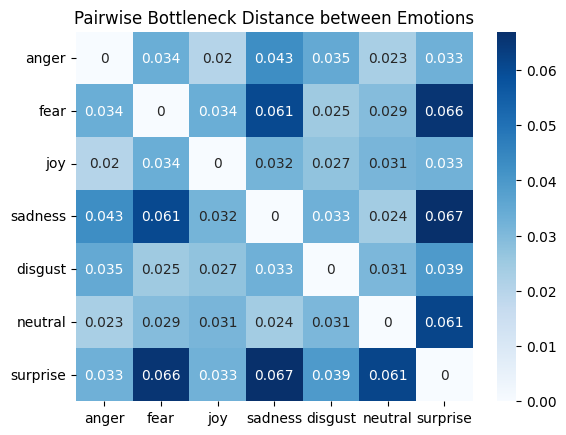

In [13]:
# Convert to square matrix
emotion_labels = emotions
matrix = np.zeros((7, 7))
for (e1, e2), score in results.items():
    i, j = emotion_labels.index(e1), emotion_labels.index(e2)
    matrix[i, j] = matrix[j, i] = score['bottleneck']

sns.heatmap(pd.DataFrame(matrix, index=emotion_labels, columns=emotion_labels), annot=True, cmap="Blues")
plt.title("Pairwise Bottleneck Distance between Emotions")
plt.show()

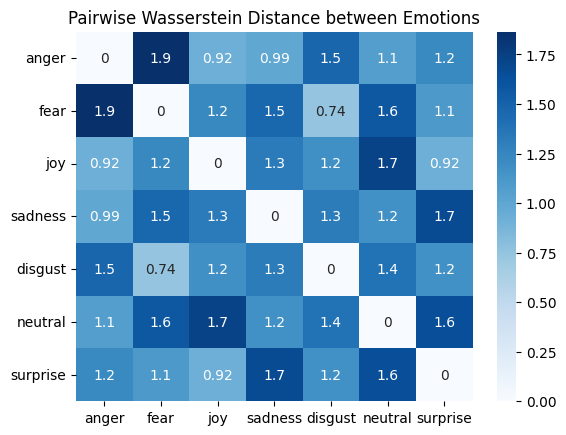

In [14]:
# Convert to square matrix
emotion_labels = emotions
matrix = np.zeros((7, 7))
for (e1, e2), score in results.items():
    i, j = emotion_labels.index(e1), emotion_labels.index(e2)
    matrix[i, j] = matrix[j, i] = score['wasserstein']

sns.heatmap(pd.DataFrame(matrix, index=emotion_labels, columns=emotion_labels), annot=True, cmap="Blues")
plt.title("Pairwise Wasserstein Distance between Emotions")
plt.show()

In [15]:
X = []
y = []

for emotion, points in emotion_point_clouds.items():
    for point in points:
        X.append(point)
        y.append(emotion)

X = np.array(X)
y = np.array(y)

In [16]:
umap_model = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
X_umap = umap_model.fit_transform(X)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(
/usr/local/lib/python3.11/dist-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(


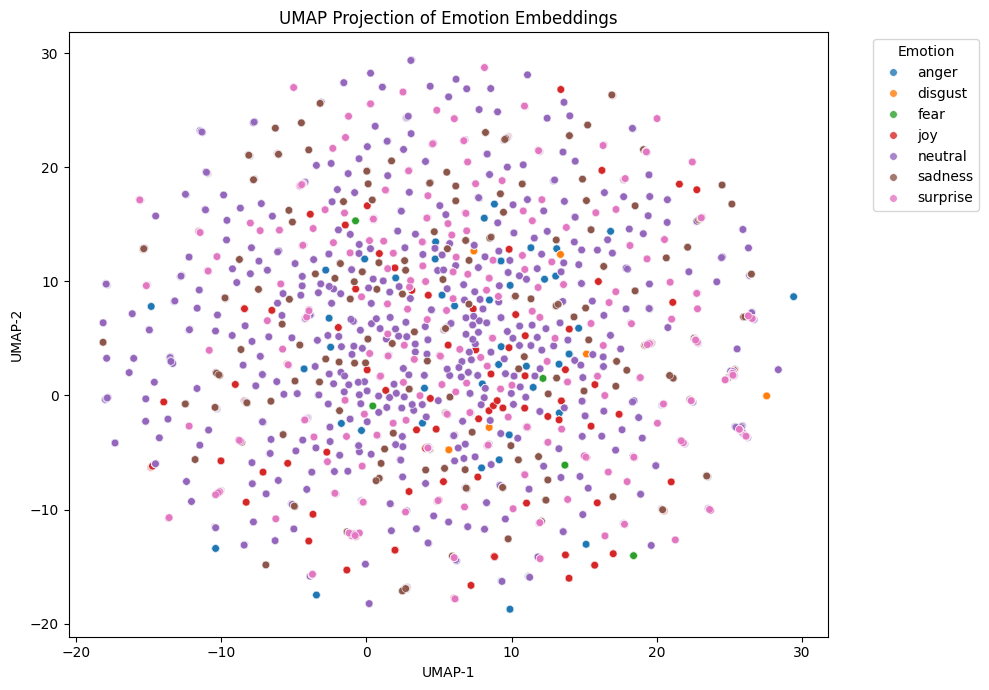

In [17]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_umap[:, 0], y=X_umap[:, 1], hue=y, palette='tab10', s=30, alpha=0.8)
plt.title("UMAP Projection of Emotion Embeddings")
plt.xlabel("UMAP-1")
plt.ylabel("UMAP-2")
plt.legend(title='Emotion', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [18]:
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

lens = umap.UMAP(n_components=2).fit_transform(X)

mapper = km.KeplerMapper(verbose=1)

graph = mapper.map(
    lens,
    np.array(X),  # your embeddings
    cover=km.Cover(n_cubes=10, perc_overlap=0.3),
    clusterer=DBSCAN(eps=0.5, min_samples=3)
)

mapper.visualize(
    graph,
    path_html="kepler_emotions_w_neutral.html",
    title="Kepler Mapper of Emotion Embeddings",
    color_values=y_encoded,
    color_function_name="Emotion",
    custom_tooltips=y
)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


KeplerMapper(verbose=1)
Mapping on data shaped (23490, 384) using lens shaped (23490, 2)

Creating 100 hypercubes.

Created 3929 edges and 4899 nodes in 0:00:12.952136.
Wrote visualization to: kepler_emotions_w_neutral.html


'<!DOCTYPE html>\n<html>\n\n<head>\n  <meta charset="utf-8">\n  <meta name="generator" content="KeplerMapper">\n  <title>Kepler Mapper of Emotion Embeddings | KeplerMapper</title>\n\n  <link rel="icon" type="image/png" href="http://i.imgur.com/axOG6GJ.jpg" />\n\n  <link href=\'https://fonts.googleapis.com/css?family=Roboto+Mono:700,300\' rel=\'stylesheet\' type=\'text/css\'>\n  <style>* {\n  margin: 0;\n  padding: 0;\n}\n\nhtml, body {\n  height: 100%;\n}\n\nbody {\n  font-family: "Roboto Mono", "Helvetica", sans-serif;\n  font-size: 14px;\n}\n\n#logo {\n  width:  85px;\n  height: 85px;\n}\n\n#display {\n  color: #95A5A6;\n  background: #212121;\n}\n\n#header {\n  background: #111111;\n}\n\n#print {\n  color: #000;\n  background: #FFF;\n}\n\nh1 {\n  font-size: 21px;\n  font-weight: 300;\n  font-weight: 300;\n}\n\nh2 {\n  font-size: 18px;\n  padding-bottom: 20px;\n  font-weight: 300;\n}\n\nh3 {\n  font-size: 14px;\n  font-weight: 700;\n  text-transform: uppercase;\n}\n\nh4 {\n  font-siz

In [19]:
X = []
y = []

del emotion_point_clouds['neutral']
for emotion, points in emotion_point_clouds.items():
    for point in points:
        X.append(point)
        y.append(emotion)

X = np.array(X)
y = np.array(y)

In [20]:
umap_model = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
X_umap = umap_model.fit_transform(X)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


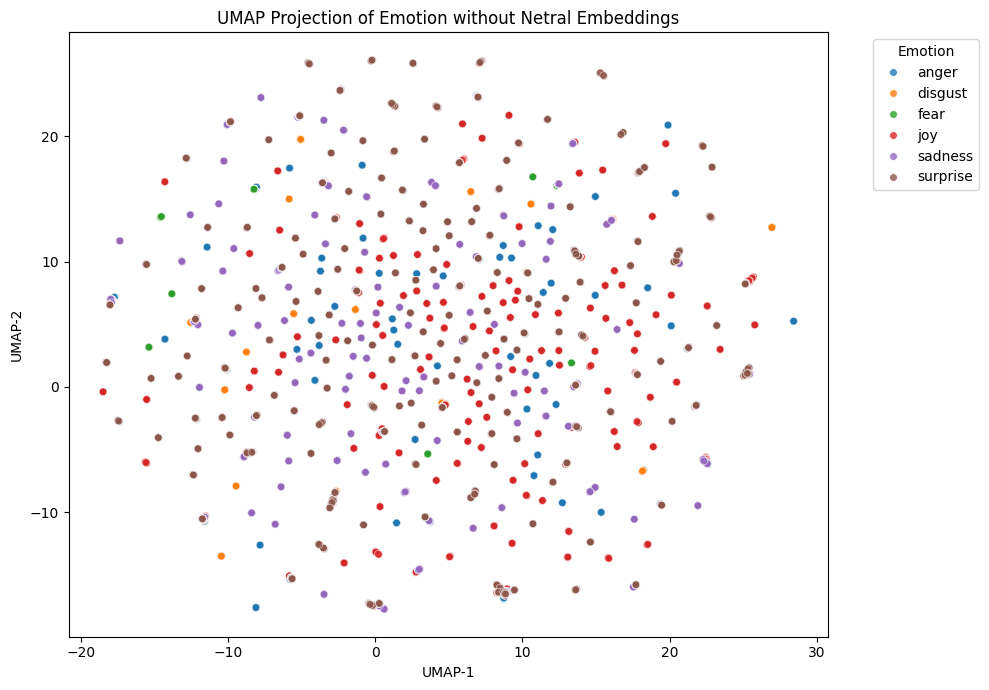

In [21]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_umap[:, 0], y=X_umap[:, 1], hue=y, palette='tab10', s=30, alpha=0.8)
plt.title("UMAP Projection of Emotion without Netral Embeddings")
plt.xlabel("UMAP-1")
plt.ylabel("UMAP-2")
plt.legend(title='Emotion', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [23]:
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

lens = umap.UMAP(n_components=2).fit_transform(X)

mapper = km.KeplerMapper(verbose=1)

graph = mapper.map(
    lens,
    np.array(X),  # your embeddings
    cover=km.Cover(n_cubes=10, perc_overlap=0.3),
    clusterer=DBSCAN(eps=0.5, min_samples=3)
)

mapper.visualize(
    graph,
    path_html="kepler_emotions_wo_neutral.html",
    title="Kepler Mapper of Emotion Embeddings",
    color_values=y_encoded,
    color_function_name="Emotion",
    custom_tooltips=y
)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


KeplerMapper(verbose=1)
Mapping on data shaped (12186, 384) using lens shaped (12186, 2)

Creating 100 hypercubes.

Created 1801 edges and 2447 nodes in 0:00:02.757531.
Wrote visualization to: kepler_emotions_wo_neutral.html


'<!DOCTYPE html>\n<html>\n\n<head>\n  <meta charset="utf-8">\n  <meta name="generator" content="KeplerMapper">\n  <title>Kepler Mapper of Emotion Embeddings | KeplerMapper</title>\n\n  <link rel="icon" type="image/png" href="http://i.imgur.com/axOG6GJ.jpg" />\n\n  <link href=\'https://fonts.googleapis.com/css?family=Roboto+Mono:700,300\' rel=\'stylesheet\' type=\'text/css\'>\n  <style>* {\n  margin: 0;\n  padding: 0;\n}\n\nhtml, body {\n  height: 100%;\n}\n\nbody {\n  font-family: "Roboto Mono", "Helvetica", sans-serif;\n  font-size: 14px;\n}\n\n#logo {\n  width:  85px;\n  height: 85px;\n}\n\n#display {\n  color: #95A5A6;\n  background: #212121;\n}\n\n#header {\n  background: #111111;\n}\n\n#print {\n  color: #000;\n  background: #FFF;\n}\n\nh1 {\n  font-size: 21px;\n  font-weight: 300;\n  font-weight: 300;\n}\n\nh2 {\n  font-size: 18px;\n  padding-bottom: 20px;\n  font-weight: 300;\n}\n\nh3 {\n  font-size: 14px;\n  font-weight: 700;\n  text-transform: uppercase;\n}\n\nh4 {\n  font-siz

## Now looking at the VAD scores:

In [24]:
# path = "Emotions/"
path = ""     # the root path to access the csv files with the labelled emotions

# list of emotions that we are working with
vad = ["ar", "dom", "val"]
# vad = ["Valence/", "Dominance/", "Arousal/"]
ranges = ["-1-0", "0-1"]

fnames = []
for v in vad:
    for r in ranges:
        fnames.append(v + "_" + r )
fnames

point_clouds = {}

In [25]:
for f in fnames:
    df  = pd.read_csv(path + f + ".csv")
    dialogues = df['Utterance'].tolist()
    point_clouds[f] = model.encode(dialogues, convert_to_tensor=True)
    point_clouds[f] = np.array(point_clouds[f])
    print(f, point_clouds[f].shape)

ar_-1-0 (1760, 384)
ar_0-1 (675, 384)
dom_-1-0 (1135, 384)
dom_0-1 (1300, 384)
val_-1-0 (511, 384)
val_0-1 (1924, 384)


In [26]:
results = {}
warnings.filterwarnings("ignore", message="The input point cloud has more columns than rows; did you mean to transpose?")
for i in range(len(fnames)):
    for j in range(i+1, len(fnames)):
        f1, f2 = fnames[i], fnames[j]
        pc1 = subsample(point_clouds[f1], n=511)
        pc2 = subsample(point_clouds[f2], n=511)

        diag1 = get_persistence(pc1)
        diag2 = get_persistence(pc2)

        w, b = compare(diag1, diag2)
        results[(f1, f2)] = {'wasserstein': w, 'bottleneck': b}

        print(f"{f1} vs {f2} — Wasserstein: {w:.4f}, Bottleneck: {b:.4f}")

ar_-1-0 vs ar_0-1 — Wasserstein: 8.2194, Bottleneck: 0.0379
ar_-1-0 vs dom_-1-0 — Wasserstein: 5.1751, Bottleneck: 0.0323
ar_-1-0 vs dom_0-1 — Wasserstein: 7.8953, Bottleneck: 0.0386
ar_-1-0 vs val_-1-0 — Wasserstein: 9.7843, Bottleneck: 0.0622
ar_-1-0 vs val_0-1 — Wasserstein: 7.9941, Bottleneck: 0.0553
ar_0-1 vs dom_-1-0 — Wasserstein: 5.5922, Bottleneck: 0.0485
ar_0-1 vs dom_0-1 — Wasserstein: 5.5461, Bottleneck: 0.0439
ar_0-1 vs val_-1-0 — Wasserstein: 11.5792, Bottleneck: 0.0627
ar_0-1 vs val_0-1 — Wasserstein: 5.9945, Bottleneck: 0.0335
dom_-1-0 vs dom_0-1 — Wasserstein: 8.1745, Bottleneck: 0.0532
dom_-1-0 vs val_-1-0 — Wasserstein: 6.5504, Bottleneck: 0.0399
dom_-1-0 vs val_0-1 — Wasserstein: 7.9880, Bottleneck: 0.0989
dom_0-1 vs val_-1-0 — Wasserstein: 13.2880, Bottleneck: 0.0720
dom_0-1 vs val_0-1 — Wasserstein: 7.2936, Bottleneck: 0.0360
val_-1-0 vs val_0-1 — Wasserstein: 12.3169, Bottleneck: 0.0509


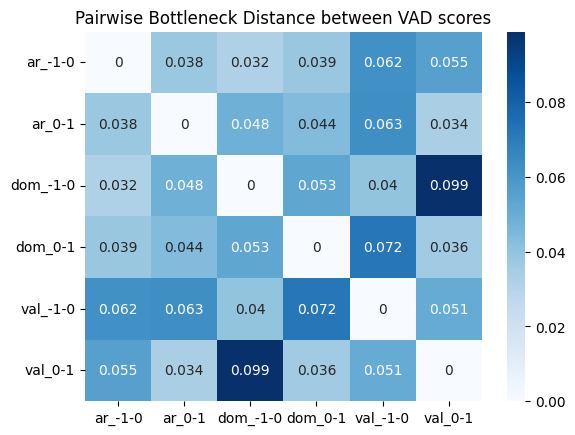

In [27]:
labels = fnames
matrix = np.zeros((6, 6))
for (e1, e2), score in results.items():
    i, j = labels.index(e1), labels.index(e2)
    matrix[i, j] = matrix[j, i] = score['bottleneck']

sns.heatmap(pd.DataFrame(matrix, index=labels, columns=labels), annot=True, cmap="Blues")
plt.title("Pairwise Bottleneck Distance between VAD scores")
plt.show()

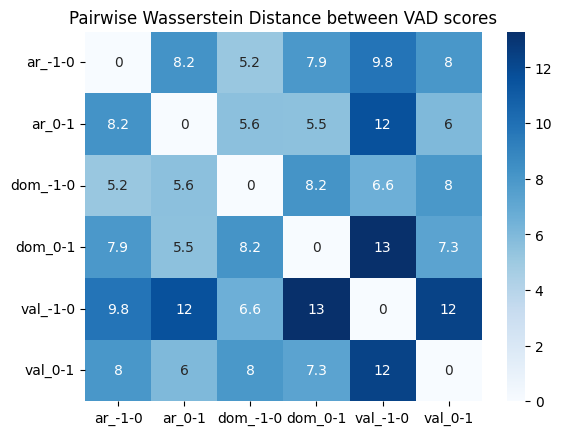

In [28]:
labels = fnames
matrix = np.zeros((6, 6))
for (e1, e2), score in results.items():
    i, j = labels.index(e1), labels.index(e2)
    matrix[i, j] = matrix[j, i] = score['wasserstein']

sns.heatmap(pd.DataFrame(matrix, index=labels, columns=labels), annot=True, cmap="Blues")
plt.title("Pairwise Wasserstein Distance between VAD scores")
plt.show()

In [29]:
X = []
y = []

for f in ["/content/val_-1-0.csv", "/content/val_0-1.csv"]:
    df = pd.read_csv(f)
    for row in df.itertuples():
        dialogue = row.Utterance
        X.append(np.array(model.encode(dialogue, convert_to_tensor=True)))
        y.append(row.Valence)

X = np.array(X)
y = np.array(y)


In [30]:
umap_model = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
X_umap = umap_model.fit_transform(X)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


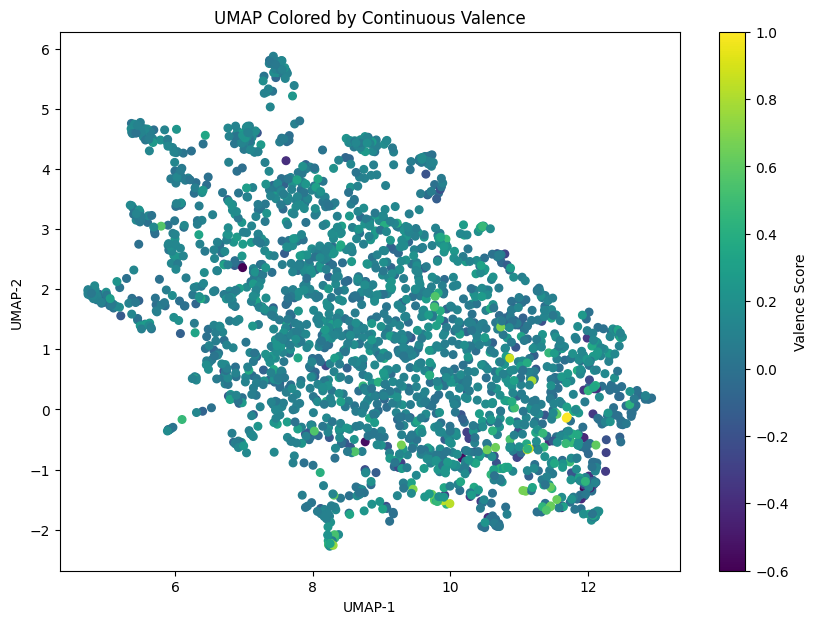

In [31]:
plt.figure(figsize=(10, 7))
scatter = plt.scatter(X_umap[:, 0], X_umap[:, 1], c=y, cmap='viridis', s=30)
plt.colorbar(scatter, label='Valence Score')
plt.title("UMAP Colored by Continuous Valence")
plt.xlabel("UMAP-1")
plt.ylabel("UMAP-2")
plt.show()

In [32]:
mapper = km.KeplerMapper(verbose=1)

lens = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42).fit_transform(X)

graph = mapper.map(
    lens,
    X,                          # the original data
    cover=km.Cover(n_cubes=10, perc_overlap=0.3),  # adjust based on density
    clusterer=km.cluster.DBSCAN(eps=0.5, min_samples=3)  # can change to KMeans
)

mapper.visualize(
    graph,
    path_html="kepler_map_valence.html",
    title="Kepler Mapper of Sentence Embeddings",
    color_values=y,
    color_function_name="Valence Score"
)

KeplerMapper(verbose=1)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Mapping on data shaped (2435, 384) using lens shaped (2435, 2)

Creating 100 hypercubes.

Created 14 edges and 24 nodes in 0:00:00.135122.
Wrote visualization to: kepler_map_valence.html


'<!DOCTYPE html>\n<html>\n\n<head>\n  <meta charset="utf-8">\n  <meta name="generator" content="KeplerMapper">\n  <title>Kepler Mapper of Sentence Embeddings | KeplerMapper</title>\n\n  <link rel="icon" type="image/png" href="http://i.imgur.com/axOG6GJ.jpg" />\n\n  <link href=\'https://fonts.googleapis.com/css?family=Roboto+Mono:700,300\' rel=\'stylesheet\' type=\'text/css\'>\n  <style>* {\n  margin: 0;\n  padding: 0;\n}\n\nhtml, body {\n  height: 100%;\n}\n\nbody {\n  font-family: "Roboto Mono", "Helvetica", sans-serif;\n  font-size: 14px;\n}\n\n#logo {\n  width:  85px;\n  height: 85px;\n}\n\n#display {\n  color: #95A5A6;\n  background: #212121;\n}\n\n#header {\n  background: #111111;\n}\n\n#print {\n  color: #000;\n  background: #FFF;\n}\n\nh1 {\n  font-size: 21px;\n  font-weight: 300;\n  font-weight: 300;\n}\n\nh2 {\n  font-size: 18px;\n  padding-bottom: 20px;\n  font-weight: 300;\n}\n\nh3 {\n  font-size: 14px;\n  font-weight: 700;\n  text-transform: uppercase;\n}\n\nh4 {\n  font-si

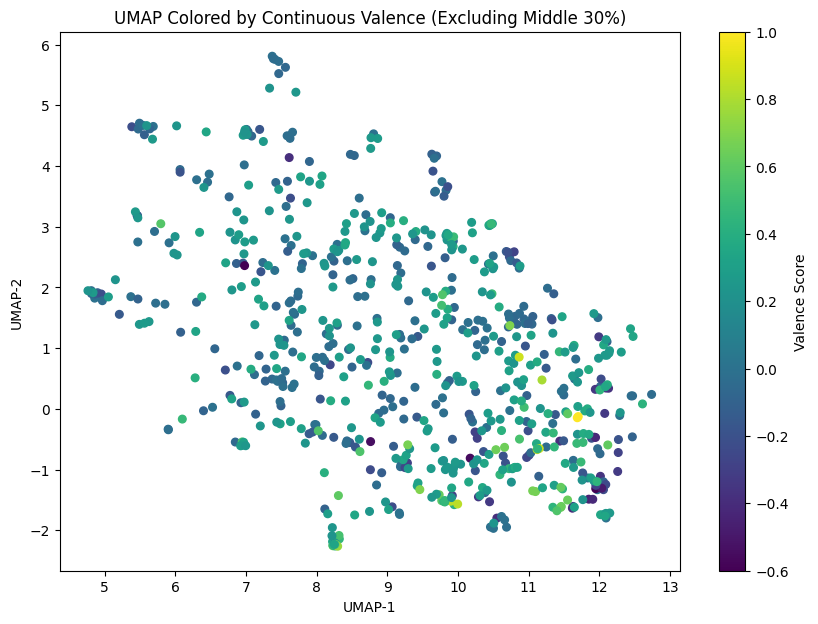

In [33]:
lower_thresh = np.percentile(y, 15)
upper_thresh = np.percentile(y, 85)

mask = (y < lower_thresh) | (y > upper_thresh)

X_umap_filtered = X_umap[mask]
y_filtered = y[mask]

plt.figure(figsize=(10, 7))
scatter = plt.scatter(X_umap_filtered[:, 0], X_umap_filtered[:, 1], c=y_filtered, cmap='viridis', s=30)
plt.colorbar(scatter, label='Valence Score')
plt.title("UMAP Colored by Continuous Valence (Excluding Middle 30%)")
plt.xlabel("UMAP-1")
plt.ylabel("UMAP-2")
plt.show()

In [34]:
X = []
y = []

for f in ["/content/ar_-1-0.csv", "/content/ar_0-1.csv"]:
    df = pd.read_csv(f)
    for row in df.itertuples():
        dialogue = row.Utterance
        X.append(np.array(model.encode(dialogue, convert_to_tensor=True)))
        y.append(row.Arousal)

X = np.array(X)
y = np.array(y)

In [35]:
umap_model = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
X_umap = umap_model.fit_transform(X)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


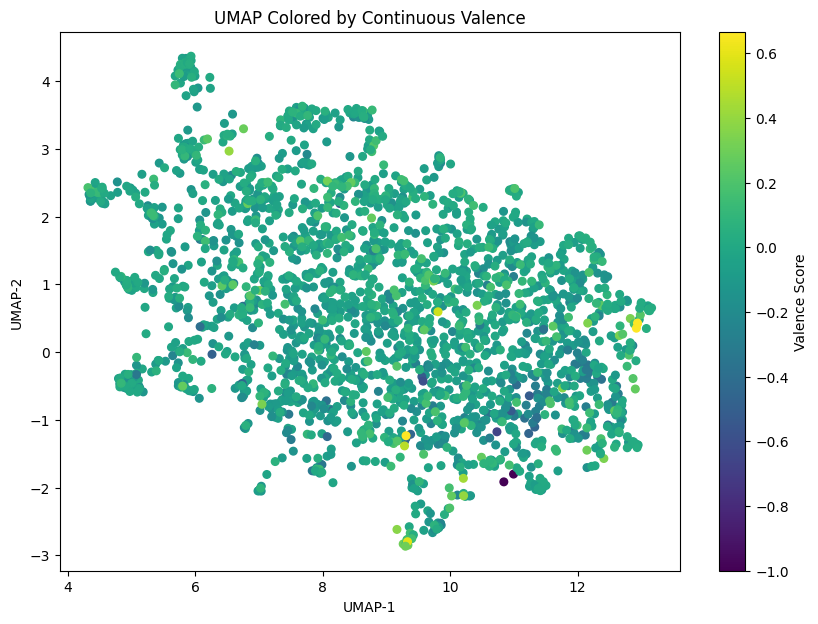

In [36]:
plt.figure(figsize=(10, 7))
scatter = plt.scatter(X_umap[:, 0], X_umap[:, 1], c=y, cmap='viridis', s=30)
plt.colorbar(scatter, label='Valence Score')
plt.title("UMAP Colored by Continuous Valence")
plt.xlabel("UMAP-1")
plt.ylabel("UMAP-2")
plt.show()

In [37]:
mapper = km.KeplerMapper(verbose=1)

lens = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42).fit_transform(X)

graph = mapper.map(
    lens,
    X,                          # the original data
    cover=km.Cover(n_cubes=10, perc_overlap=0.3),  # adjust based on density
    clusterer=km.cluster.DBSCAN(eps=0.5, min_samples=3)  # can change to KMeans
)

mapper.visualize(
    graph,
    path_html="kepler_map_arousal.html",
    title="Kepler Mapper of Sentence Embeddings",
    color_values=y,
    color_function_name="Arousal Score"
)

KeplerMapper(verbose=1)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Mapping on data shaped (2435, 384) using lens shaped (2435, 2)

Creating 100 hypercubes.

Created 20 edges and 27 nodes in 0:00:00.122195.
Wrote visualization to: kepler_map_arousal.html


'<!DOCTYPE html>\n<html>\n\n<head>\n  <meta charset="utf-8">\n  <meta name="generator" content="KeplerMapper">\n  <title>Kepler Mapper of Sentence Embeddings | KeplerMapper</title>\n\n  <link rel="icon" type="image/png" href="http://i.imgur.com/axOG6GJ.jpg" />\n\n  <link href=\'https://fonts.googleapis.com/css?family=Roboto+Mono:700,300\' rel=\'stylesheet\' type=\'text/css\'>\n  <style>* {\n  margin: 0;\n  padding: 0;\n}\n\nhtml, body {\n  height: 100%;\n}\n\nbody {\n  font-family: "Roboto Mono", "Helvetica", sans-serif;\n  font-size: 14px;\n}\n\n#logo {\n  width:  85px;\n  height: 85px;\n}\n\n#display {\n  color: #95A5A6;\n  background: #212121;\n}\n\n#header {\n  background: #111111;\n}\n\n#print {\n  color: #000;\n  background: #FFF;\n}\n\nh1 {\n  font-size: 21px;\n  font-weight: 300;\n  font-weight: 300;\n}\n\nh2 {\n  font-size: 18px;\n  padding-bottom: 20px;\n  font-weight: 300;\n}\n\nh3 {\n  font-size: 14px;\n  font-weight: 700;\n  text-transform: uppercase;\n}\n\nh4 {\n  font-si

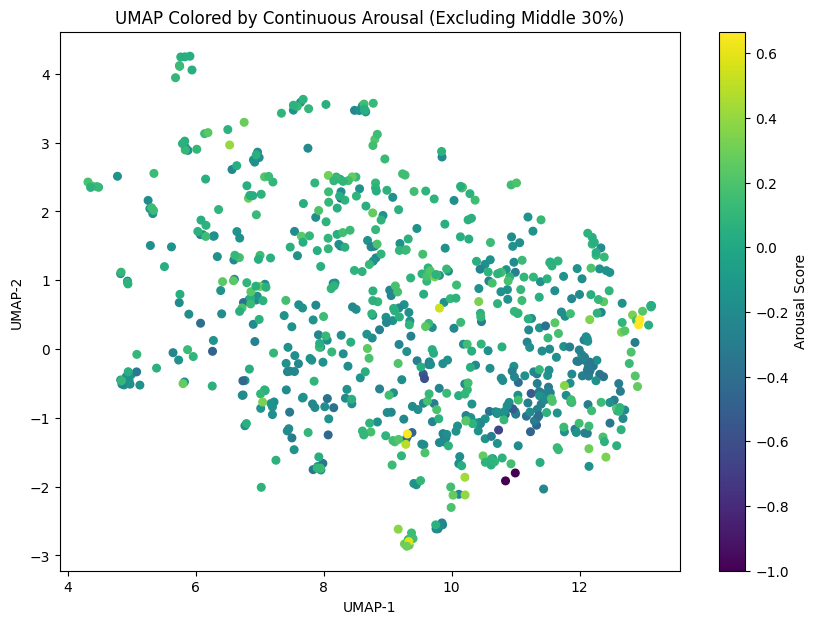

In [38]:
lower_thresh = np.percentile(y, 15)
upper_thresh = np.percentile(y, 85)

mask = (y < lower_thresh) | (y > upper_thresh)

X_umap_filtered = X_umap[mask]
y_filtered = y[mask]

plt.figure(figsize=(10, 7))
scatter = plt.scatter(X_umap_filtered[:, 0], X_umap_filtered[:, 1], c=y_filtered, cmap='viridis', s=30)
plt.colorbar(scatter, label='Arousal Score')
plt.title("UMAP Colored by Continuous Arousal (Excluding Middle 30%)")
plt.xlabel("UMAP-1")
plt.ylabel("UMAP-2")
plt.show()

In [39]:
X = []
y = []

for f in ["/content/dom_-1-0.csv", "/content/dom_0-1.csv"]:
    df = pd.read_csv(f)
    for row in df.itertuples():
        dialogue = row.Utterance
        X.append(np.array(model.encode(dialogue, convert_to_tensor=True)))
        y.append(row.Dominance)

X = np.array(X)
y = np.array(y)

In [40]:
umap_model = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
X_umap = umap_model.fit_transform(X)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


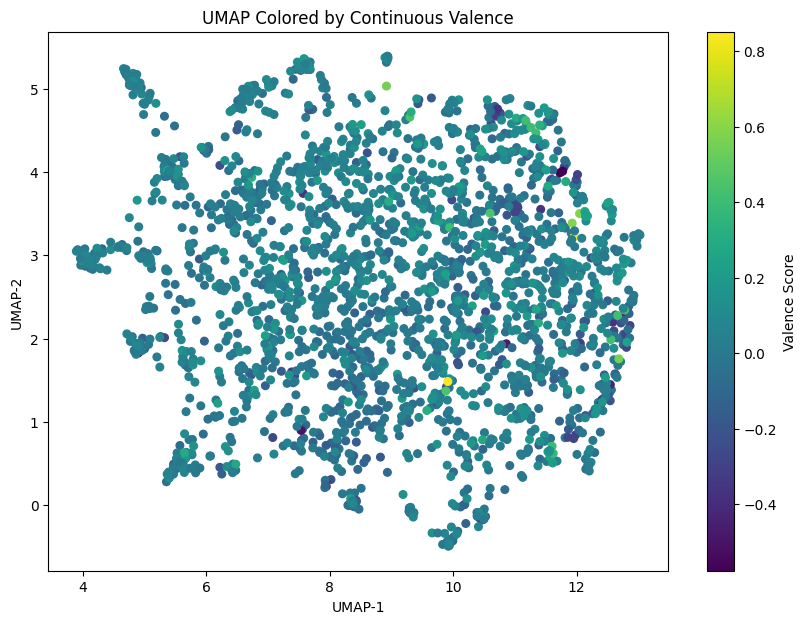

In [41]:
plt.figure(figsize=(10, 7))
scatter = plt.scatter(X_umap[:, 0], X_umap[:, 1], c=y, cmap='viridis', s=30)
plt.colorbar(scatter, label='Valence Score')
plt.title("UMAP Colored by Continuous Valence")
plt.xlabel("UMAP-1")
plt.ylabel("UMAP-2")
plt.show()

In [42]:
mapper = km.KeplerMapper(verbose=1)

lens = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42).fit_transform(X)

graph = mapper.map(
    lens,
    X,                          # the original data
    cover=km.Cover(n_cubes=10, perc_overlap=0.3),  # adjust based on density
    clusterer=km.cluster.DBSCAN(eps=0.5, min_samples=3)  # can change to KMeans
)

mapper.visualize(
    graph,
    path_html="kepler_map_dominance.html",
    title="Kepler Mapper of Sentence Embeddings",
    color_values=y,
    color_function_name="Dominance Score"
)

KeplerMapper(verbose=1)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Mapping on data shaped (2435, 384) using lens shaped (2435, 2)

Creating 100 hypercubes.

Created 8 edges and 21 nodes in 0:00:00.219708.
Wrote visualization to: kepler_map_dominance.html


'<!DOCTYPE html>\n<html>\n\n<head>\n  <meta charset="utf-8">\n  <meta name="generator" content="KeplerMapper">\n  <title>Kepler Mapper of Sentence Embeddings | KeplerMapper</title>\n\n  <link rel="icon" type="image/png" href="http://i.imgur.com/axOG6GJ.jpg" />\n\n  <link href=\'https://fonts.googleapis.com/css?family=Roboto+Mono:700,300\' rel=\'stylesheet\' type=\'text/css\'>\n  <style>* {\n  margin: 0;\n  padding: 0;\n}\n\nhtml, body {\n  height: 100%;\n}\n\nbody {\n  font-family: "Roboto Mono", "Helvetica", sans-serif;\n  font-size: 14px;\n}\n\n#logo {\n  width:  85px;\n  height: 85px;\n}\n\n#display {\n  color: #95A5A6;\n  background: #212121;\n}\n\n#header {\n  background: #111111;\n}\n\n#print {\n  color: #000;\n  background: #FFF;\n}\n\nh1 {\n  font-size: 21px;\n  font-weight: 300;\n  font-weight: 300;\n}\n\nh2 {\n  font-size: 18px;\n  padding-bottom: 20px;\n  font-weight: 300;\n}\n\nh3 {\n  font-size: 14px;\n  font-weight: 700;\n  text-transform: uppercase;\n}\n\nh4 {\n  font-si

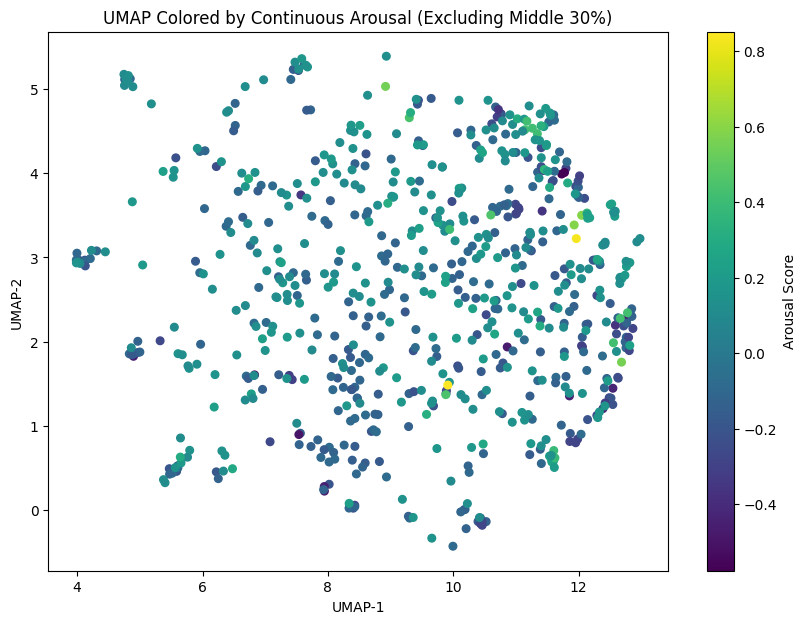

In [43]:
lower_thresh = np.percentile(y, 15)
upper_thresh = np.percentile(y, 85)

mask = (y < lower_thresh) | (y > upper_thresh)

X_umap_filtered = X_umap[mask]
y_filtered = y[mask]

plt.figure(figsize=(10, 7))
scatter = plt.scatter(X_umap_filtered[:, 0], X_umap_filtered[:, 1], c=y_filtered, cmap='viridis', s=30)
plt.colorbar(scatter, label='Arousal Score')
plt.title("UMAP Colored by Continuous Arousal (Excluding Middle 30%)")
plt.xlabel("UMAP-1")
plt.ylabel("UMAP-2")
plt.show()